(1000, 2240, 2240)
255


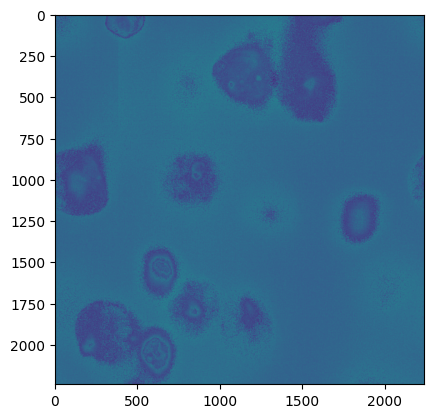

(1000, 2240, 2240)
28769


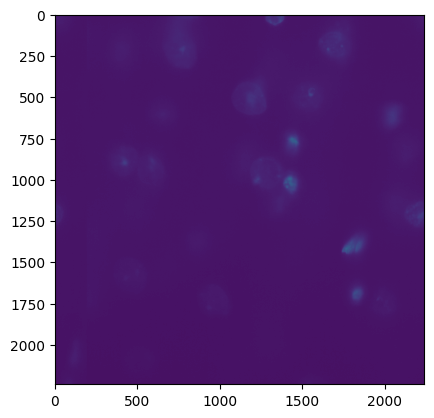

In [2]:
# open the image using stuff

import matplotlib.pyplot as plt
import numpy as np
import glob as glob
import torch
import cv2
import time
import imageio
import os

filename = '/data/jmomo/segment-anything/coord_-5.4,+18.6_2_1X.tif'
image8 = np.memmap(filename, mode='c', dtype=np.uint8, shape=(1000, 2240, 2240))
print(image8.shape)
print(max(image8[0,:,:].flatten()))
plt.imshow(image8[0,:,:])
plt.show()
image16 = np.memmap(filename, mode='c', dtype=np.uint16, shape=(1000, 2240, 2240))
print(image16.shape)
plt.imshow(image16[0,:,:], vmax=3000)
print(max(image16[0,:,:].flatten()))
plt.show()

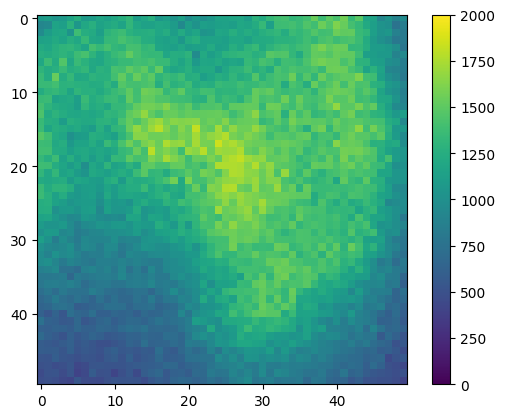

In [3]:
plt.imshow(image16[15,775:825, 1425:1475], vmin=0, vmax=2000)
#plt.imshow(image[0], vmin=0, vmax=2000)
plt.colorbar()
plt.show()

import math
print(image[0].shape)
img = 
print(img)
plt.figure(figsize=(10,10))
plt.imshow(img, vmin=0, vmax=10)

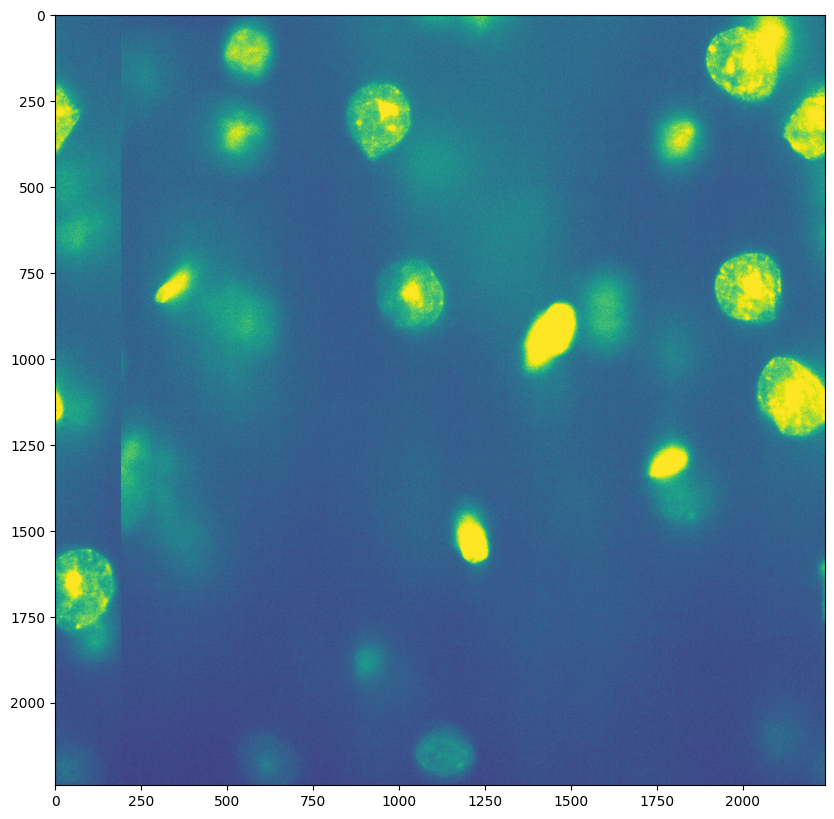

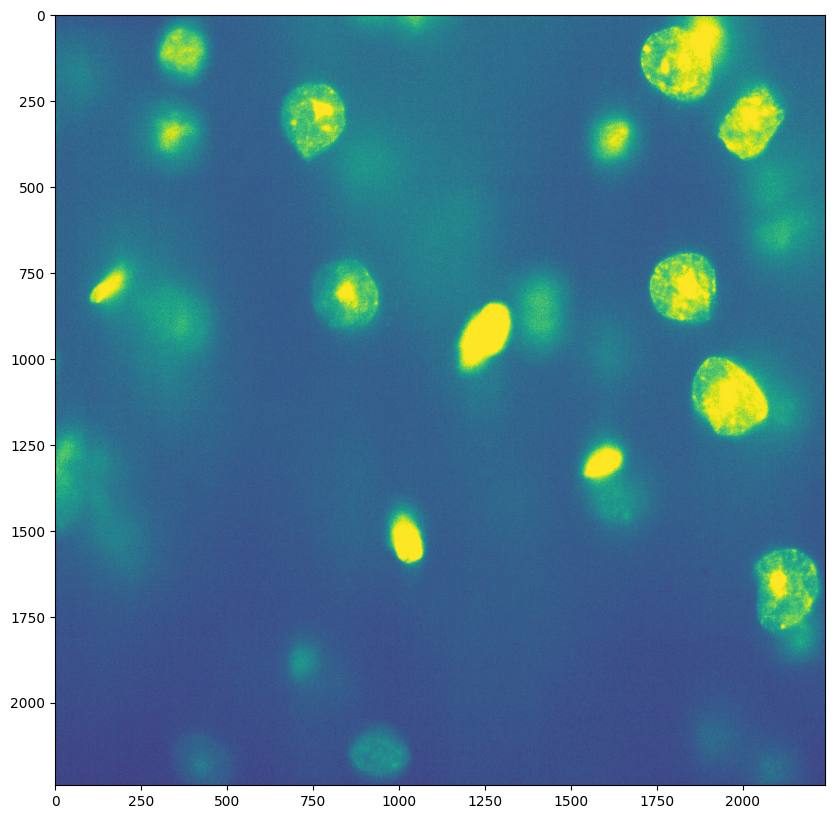

In [18]:
# fix the image offset problem
img16norm = cv2.normalize(image16[700], None, 0, 255, cv2.NORM_MINMAX)
img_float = img16norm.astype(np.float32)
factor = 5  # Adjust this factor as needed
img_bright = cv2.multiply(img_float, factor)
img_bright = np.clip(img_bright, 0, 255)
img_bright = img_bright.astype(np.uint8)

width, height = img_bright.shape

slice_num =190
left_part = img_bright[:, 0:slice_num]
right_part = img_bright[:, slice_num:width]

new_img = np.zeros_like(img_bright)
new_img[:, 0:width-slice_num] = right_part
new_img[:, width-slice_num:width] = left_part

plt.figure(figsize=(10,10))
plt.imshow(img_bright)
plt.show()

plt.figure(figsize=(10,10))
plt.imshow(new_img)
plt.show()

44


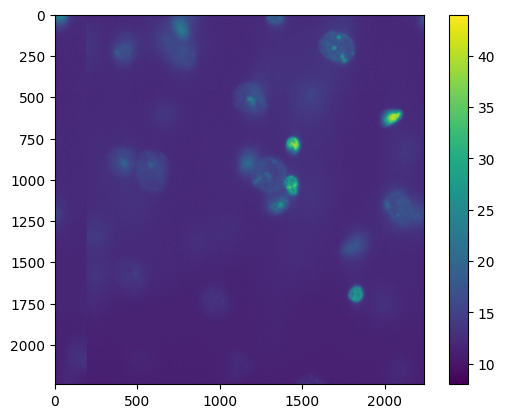

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


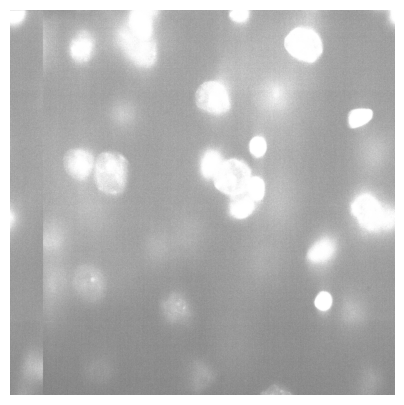

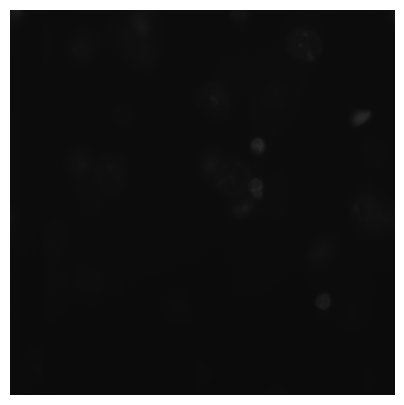

[[ 7 12  8 ... 38 44 45]
 [43 46 49 ... 39 45 49]
 [51 46 52 ... 41 42 51]
 ...
 [ 8  5  8 ...  8 14 10]
 [ 7 15  7 ... 11 11  8]
 [ 9 11  7 ... 12 11  6]]


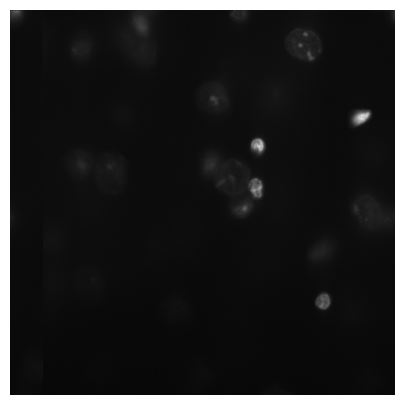

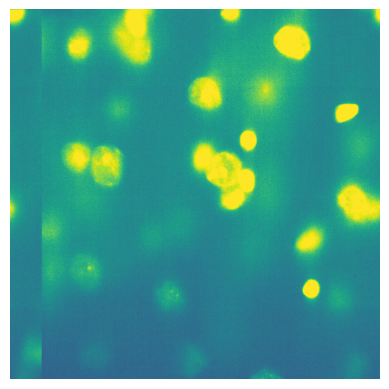

In [37]:
#square root normalization

img_16bit = image16[15]
img_sqrt = np.sqrt(img_16bit / 65535)
img_8bit = np.uint8(img_sqrt * 255)
print(max(img_8bit.flatten()))
plt.imshow(img_8bit)
plt.colorbar()
plt.show()

img = cv2.cvtColor(img_16bit, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.imshow(img)
plt.axis('off')
plt.show()

img8 = cv2.cvtColor(img_8bit, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(5,5))
plt.imshow(img8)
plt.axis('off')
plt.show()

img16norm = cv2.normalize(image16[15], None, 0, 255, cv2.NORM_MINMAX)
print(img16norm)
plt.figure(figsize=(5,5))
plt.imshow(cv2.cvtColor(img16norm, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

img_float = img16norm.astype(np.float32)
factor = 10  # Adjust this factor as needed
img_bright = cv2.multiply(img_float, factor)
img_bright = np.clip(img_bright, 0, 255)
img_bright = img_bright.astype(np.uint8)
plt.imshow(img_bright)
plt.axis('off')
plt.show()




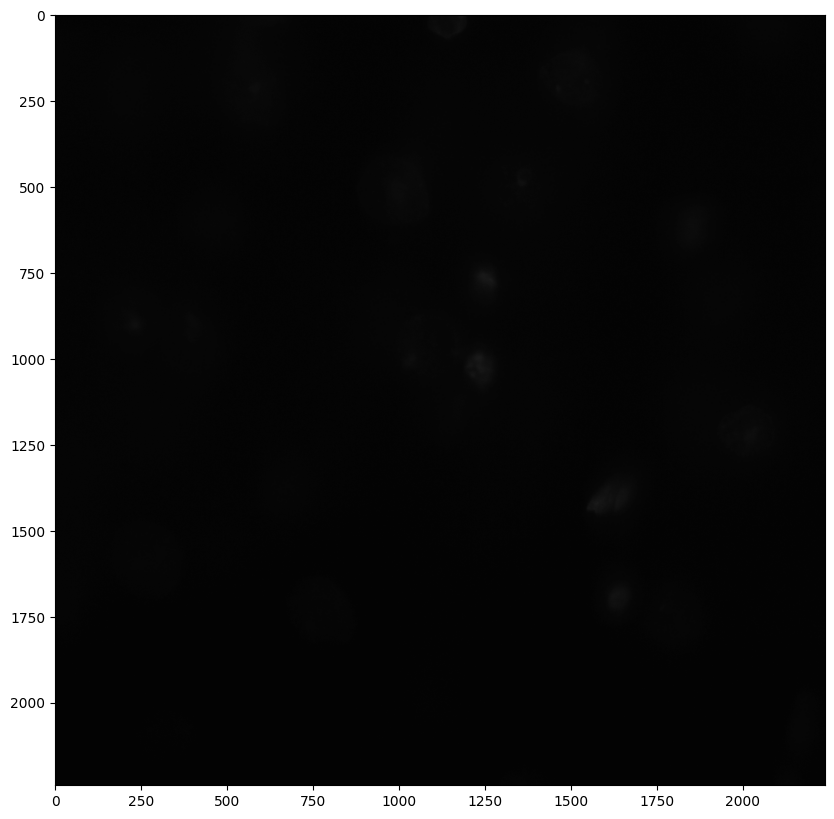

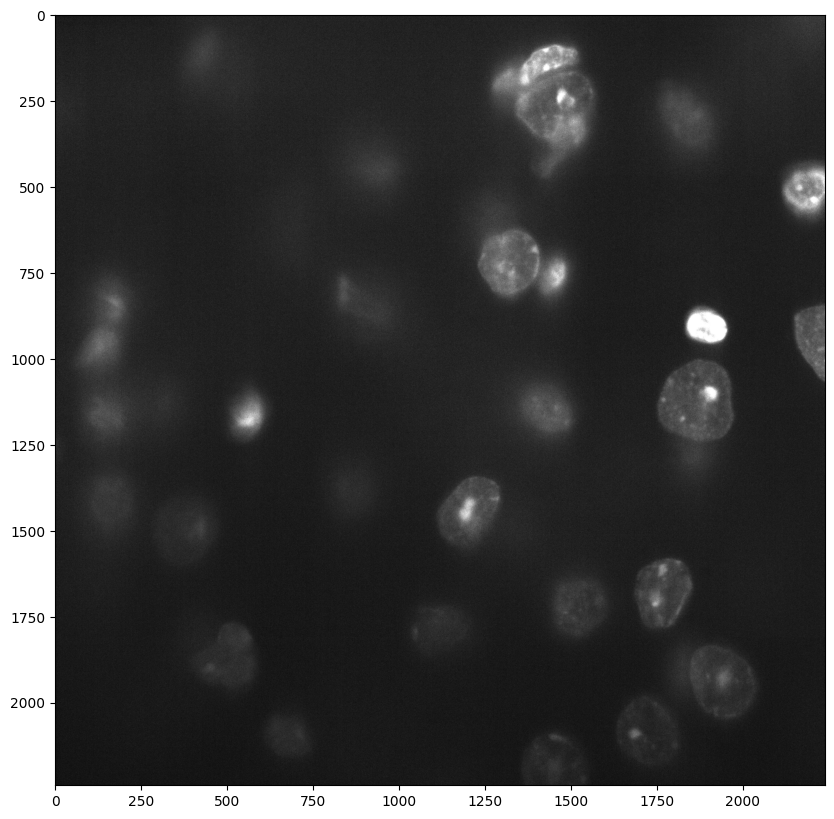

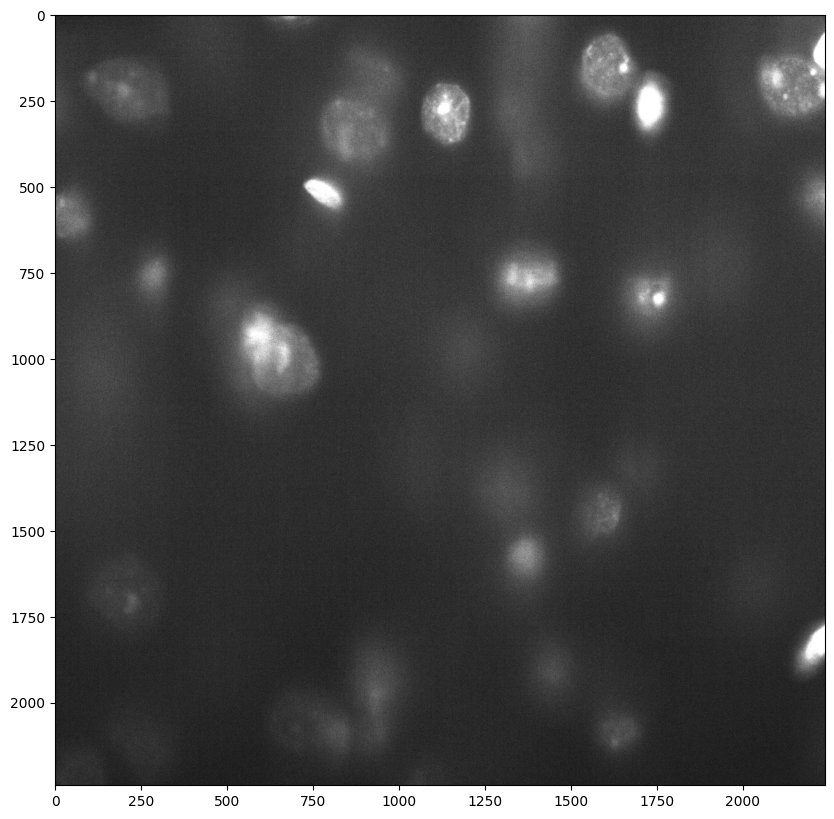

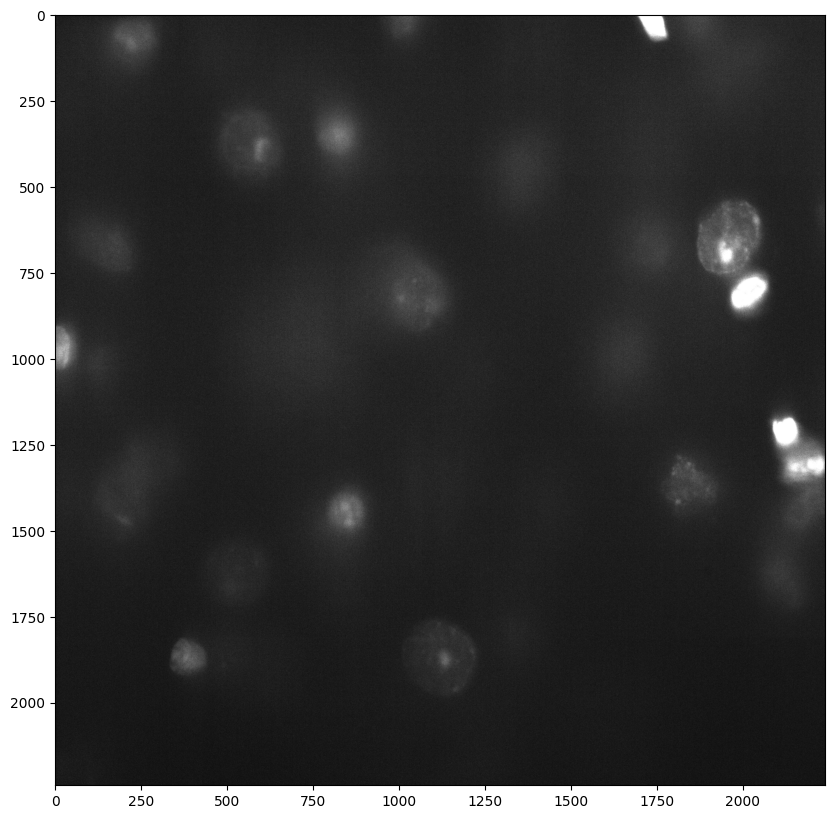

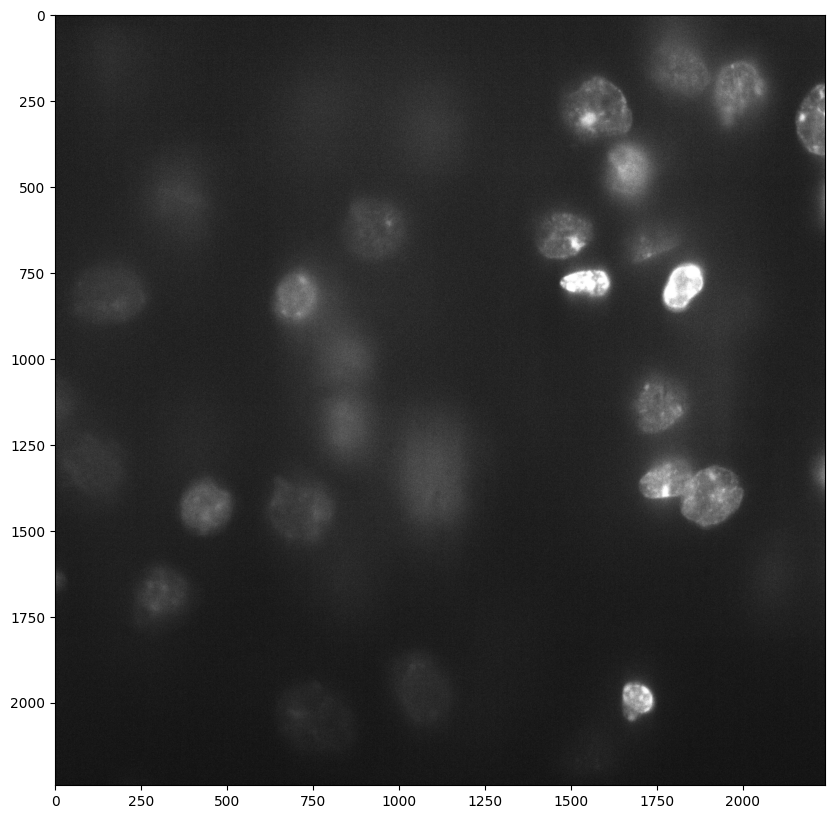

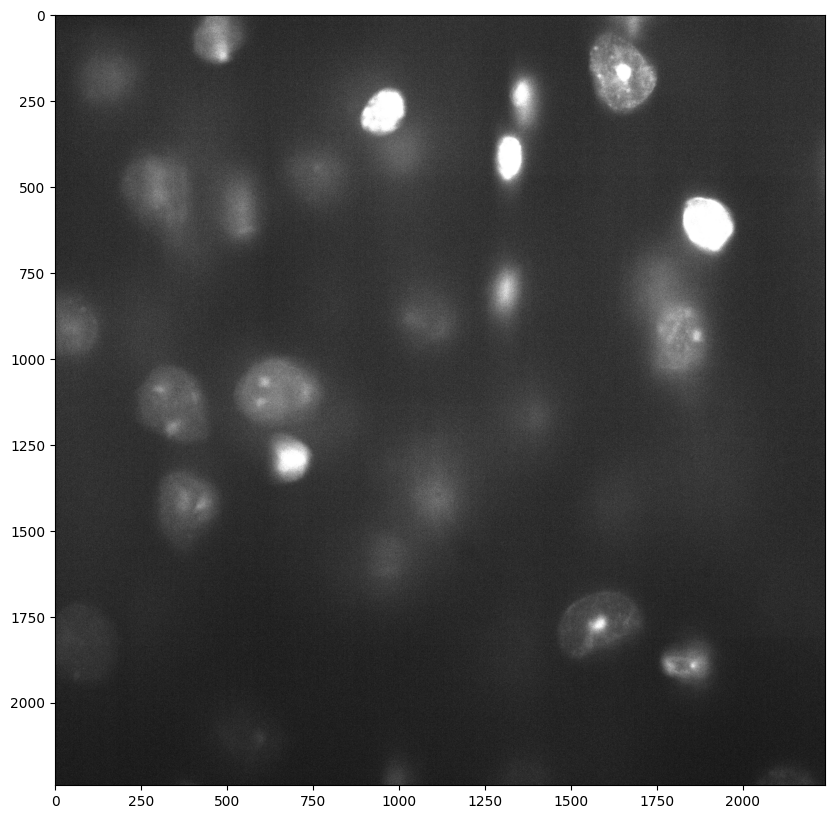

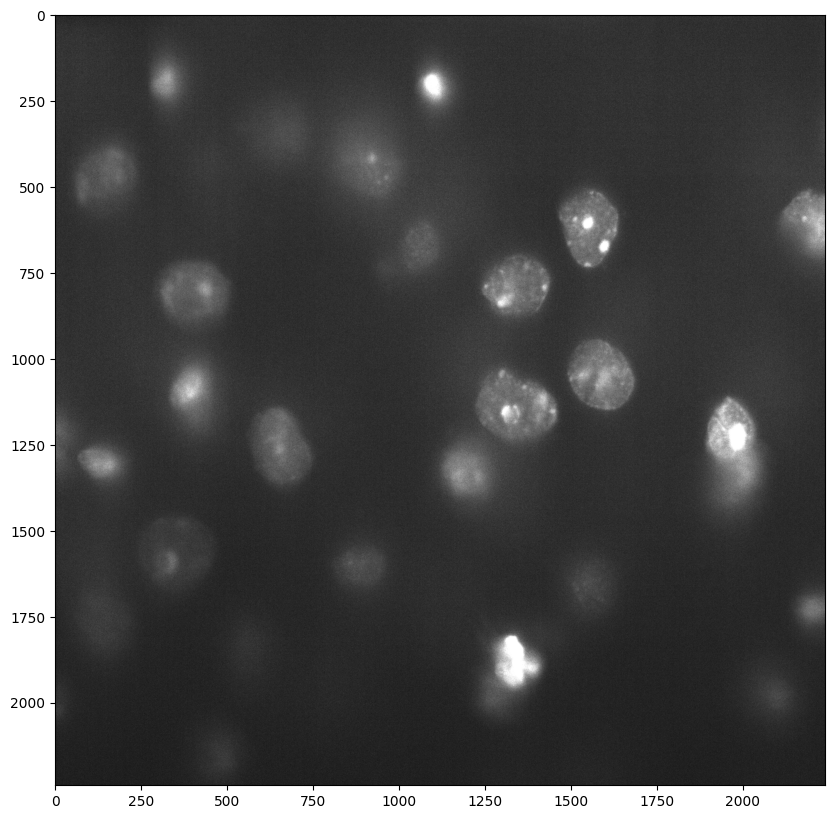

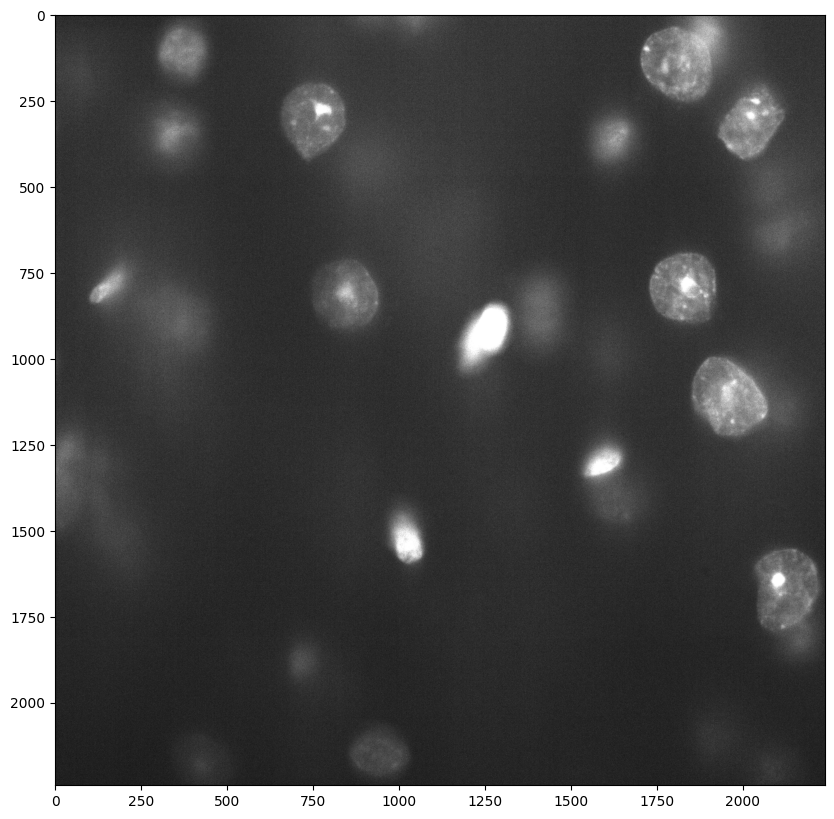

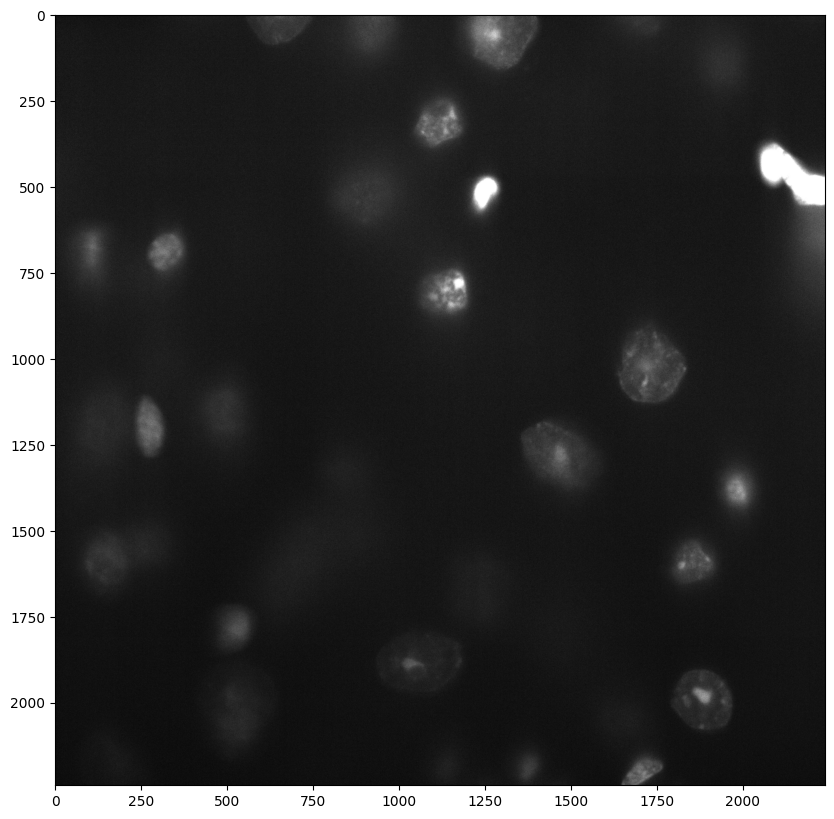

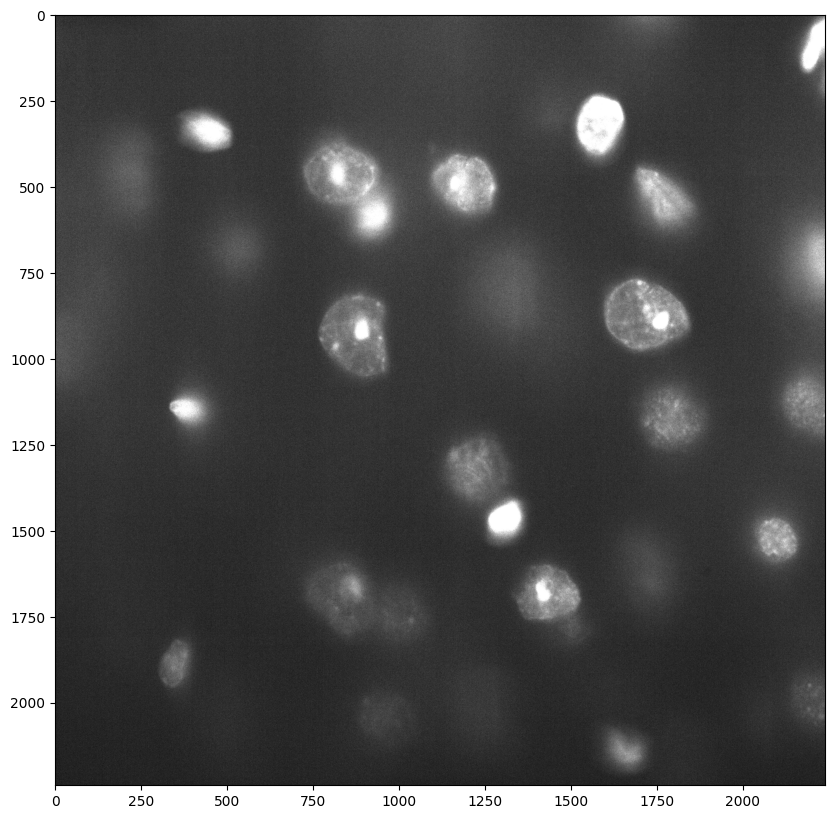

In [21]:
# preview some slices of the image
for i in range(0, image16.shape[0], 100):
    
    img16norm = cv2.normalize(image16[i], None, 0, 255, cv2.NORM_MINMAX)
    img_float = img16norm.astype(np.float32)
    factor = 3  # Adjust this factor as needed
    img_bright = cv2.multiply(img_float, factor)
    img_bright = np.clip(img_bright, 0, 255)
    img_bright = img_bright.astype(np.uint8)

    width, height = img_bright.shape

    slice_num =190
    left_part = img_bright[:, 0:slice_num]
    right_part = img_bright[:, slice_num:width]

    new_img = np.zeros_like(img_bright)
    new_img[:, 0:width-slice_num] = right_part
    new_img[:, width-slice_num:width] = left_part

    plt.figure(figsize=(10,10))
    plt.imshow(cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB))
    plt.show()

In [23]:
# run segment anything on some random slices of the image to test

def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones((sorted_anns[0]['segmentation'].shape[0], sorted_anns[0]['segmentation'].shape[1], 4))
    img[:,:,3] = 0
    for ann in sorted_anns:
        m = ann['segmentation']
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

import sys
sys.path.append("..")

from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "../sam_vit_h_4b8939.pth"
model_type = "vit_h"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam)
    

    

Elapsed time:  5.648358106613159


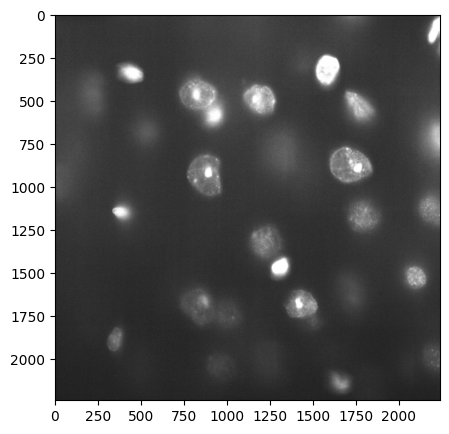

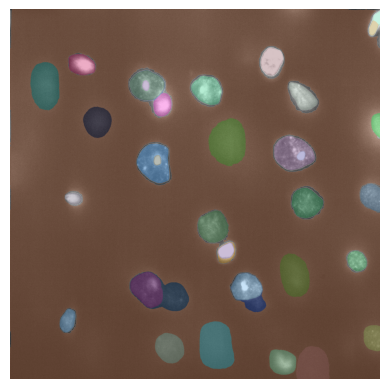

[{'segmentation': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]]), 'area': 4557152, 'bbox': [0, 0, 2239, 2239], 'predicted_iou': 1.0524981021881104, 'point_coords': [[2205.0, 1855.0]], 'stability_score': 0.9547770023345947, 'crop_box': [0, 0, 2240, 2240]}, {'segmentation': array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]]), 'area': 38206, 'bbox': [1599, 768, 247, 208], 'predicted_iou': 0.9975224137

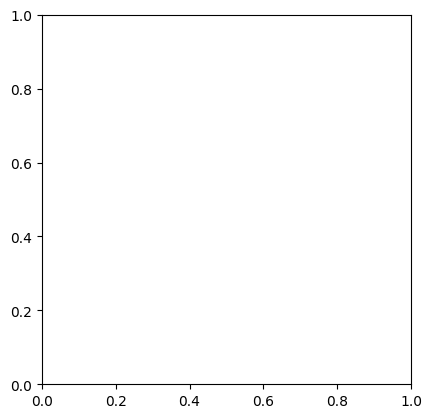

In [27]:
# run SAM on one slice of image

img16norm = cv2.normalize(image16[i], None, 0, 255, cv2.NORM_MINMAX)
img_float = img16norm.astype(np.float32)
factor = 3  # Adjust this factor as needed
img_bright = cv2.multiply(img_float, factor)
img_bright = np.clip(img_bright, 0, 255)
img_bright = img_bright.astype(np.uint8)

width, height = img_bright.shape

slice_num =190
left_part = img_bright[:, 0:slice_num]
right_part = img_bright[:, slice_num:width]

new_img = np.zeros_like(img_bright)
new_img[:, 0:width-slice_num] = right_part
new_img[:, width-slice_num:width] = left_part

img = cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB)

initial_time = time.time()
masks = mask_generator.generate(img)
print("Elapsed time: ", time.time() - initial_time)
plt.figure(figsize=(5,5))
plt.imshow(img)
plt.show()
plt.imshow(img)
show_anns(masks)
plt.axis('off')
plt.show() 
print(masks)



Elapsed time:  4.341071128845215


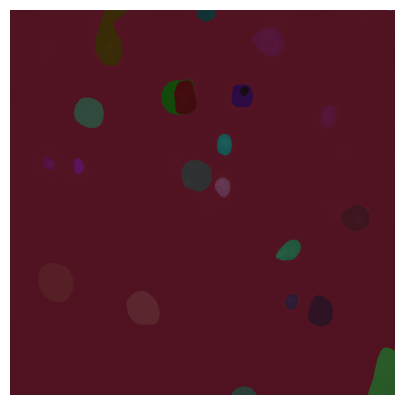

Elapsed time:  4.386205196380615


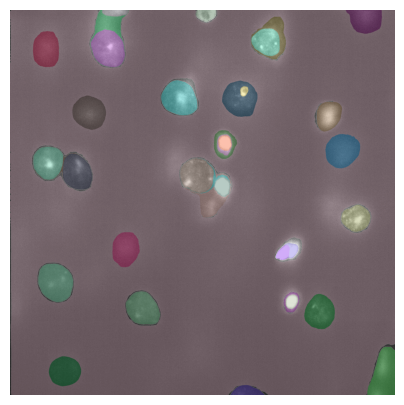

Elapsed time:  4.726621389389038


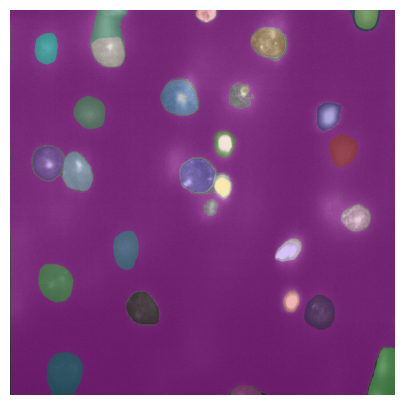

Elapsed time:  4.142687082290649


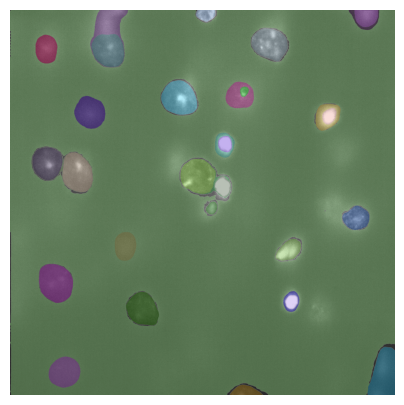

Elapsed time:  4.879075527191162


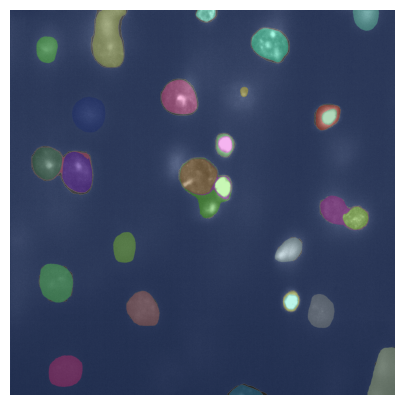

Elapsed time:  4.972614526748657


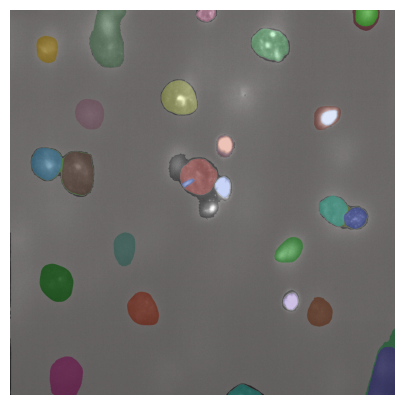

Elapsed time:  5.323371410369873


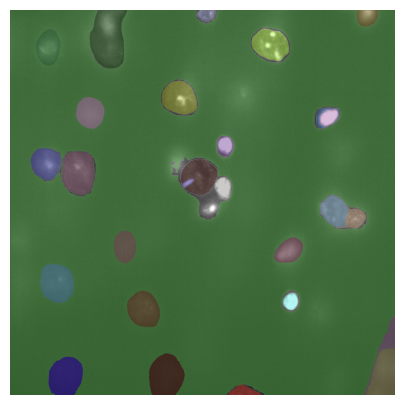

Elapsed time:  5.6842474937438965


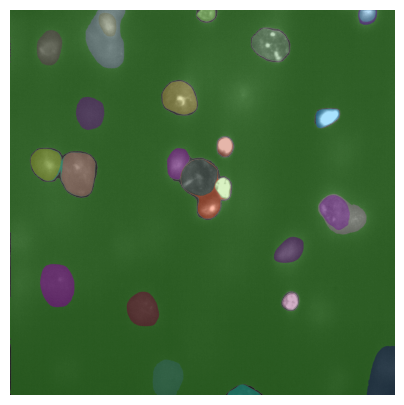

Elapsed time:  5.553627014160156


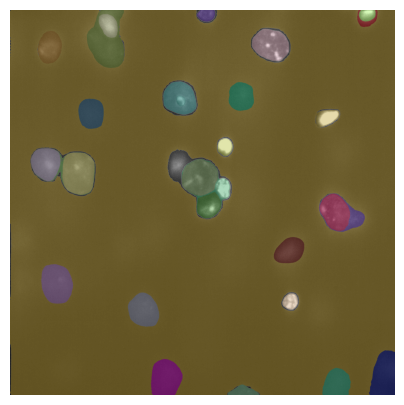

Elapsed time:  5.760996103286743


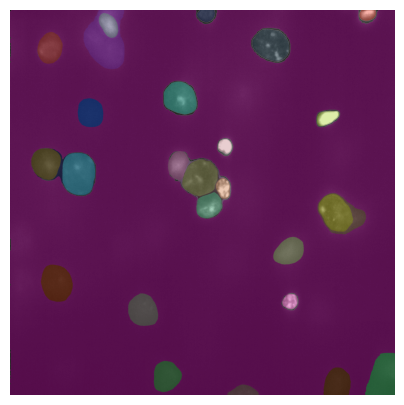

In [29]:
for i in range(0, 20, 2):
    
    img16norm = cv2.normalize(image16[i], None, 0, 255, cv2.NORM_MINMAX)
    img_float = img16norm.astype(np.float32)
    factor = 3  # Adjust this factor as needed
    img_bright = cv2.multiply(img_float, factor)
    img_bright = np.clip(img_bright, 0, 255)
    img_bright = img_bright.astype(np.uint8)

    width, height = img_bright.shape

    slice_num = 190
    left_part = img_bright[:, 0:slice_num]
    right_part = img_bright[:, slice_num:width]

    new_img = np.zeros_like(img_bright)
    new_img[:, 0:width-slice_num] = right_part
    new_img[:, width-slice_num:width] = left_part

    img = cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB)

    initial_time = time.time()
    masks = mask_generator.generate(img)
    print("Elapsed time: ", time.time() - initial_time)
    plt.figure(figsize=(5,5))
    plt.imshow(img)
    show_anns(masks)
    plt.axis('off')
    plt.show() 